In [1]:
import QUANTAXIS as QA
import sys
sys.path.append('/root/workspace/QUANTAXIS/src')
from stock_head import *
from utils import *
from model import BoostModel, XGBoostRegression
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
from QUANTAXIS.QAUtil.QASetting import *
print(DEFAULT_DB_URI)
## for qlib's data
data_dir = '/root/workspace/data/'
if not os.path.exists(data_dir):
    os.mkdir(data_dir, mode=0o777)

os.environ['TZ'] = 'Asia/Shanghai'
print(time.asctime(time.localtime(time.time())))
start_date = QA.QA_util_get_next_trade_date('2010-01-01')
end_date = QA.QA_util_get_pre_trade_date(datetime.date.today().strftime("%Y-%m-%d"))
test_date = '2017-01-26' ## test dataset start on this day
## industry standard SW_l1 changed on this day
industry_change_date = QA.QA_util_get_real_date('2014-02-21')

date_dict = QA.QAUtil.QA_util_getBetweenMonth(start_date, end_date)
monthend_date = [ QA.QA_util_format_date2str(item[1]) for item in list(date_dict.values())]
real_date_list = [x.strftime('%Y-%m-%d') for x in list(pd.date_range(start=start_date, end=end_date))]
trade_date_list = trade_date_sse[trade_date_sse.index(start_date) : trade_date_sse.index(end_date)]
month_end_trade_date = [item if QA.QA_util_if_trade(item) else QA.QA_util_get_pre_trade_date(item, 1) for item in monthend_date]
# print(month_end_trade_date[-15:])

## model & period
ranks = 3 ## use for classfication
model_list = ['xgboost']
period_list = [6, 60]
model_period = [ i+str(j) for j in period_list for i in model_list ]

# test_date = '2019-01-31'

you are using non-interactive mdoel quantaxis
auth success 
{'total': 1000000, 'spare': 1000000}
mongodb://localhost:27017
Fri Jul 23 08:49:23 2021


## 3. model
将datase划分，从test_date起，滚动的将每个月的数据作为test dataset，t-2 ~ t月的数据作为valid dataset，t-72 ~ t-2的数据作为训练集。以此类推，每个月训练一次模型并用本月数据进行predict

In [4]:
def get_train_valid_test(df, params, drop_zero=False):
    '''
    data_df: 特征数据集
    params: 包括model, date， period等，date指test集的时间
            period指训练集的长度，验证集长度固定为2，测试集为1
    drop_zero: 是否训练集、验证集中将label为0的过滤掉， 默认为False
               若为回归拟合，则为false
    输出：train_df、val_df、test_df
    '''
    train_date = month_end_trade_date[month_end_trade_date.index(params['date']) - (params['period']+3) : month_end_trade_date.index(params['date'])-2]
    val_date =  month_end_trade_date[month_end_trade_date.index(params['date'])-2 : month_end_trade_date.index(params['date'])]
    test_date = [params['date']]
    
    train_df = shuffle(df[df.date.isin(train_date)])
    val_df = shuffle(df[df.date.isin(val_date)])
    test_df = shuffle(df[df.date.isin(test_date)])
    
    if drop_zero:
        train_df = train_df[train_df['label'] != 0]
        val_df = val_df[val_df['label'] != 0]
       
    return train_df, val_df, test_df

In [5]:
def get_fitted_model(train_df, val_df, params, is_classify=True, evals_result=dict()):
    '''
    train_df: 测试集
    val_df: 验证集 +1, 0, -1常用. 01 only for xgboost
    params: 包括model, date， period， feature_cols等，    model: 模型名称，如xgboost，
            date：当前时间或者test的时间， period：训练集的长度， feature_cols：df中所用到的特征列
    is_classify: 是否为分类任务
    evals_result: dict，存储性能数据
    输出：训练过的模型 model
    '''
    feature_cols = params['feature_cols']
    train_df[feature_cols].astype(float).fillna(0, inplace=True)
    val_df[feature_cols].astype(float).fillna(0, inplace=True)    
    
    start_time = time.time()
    if is_classify:
        if params['model'] == 'xgboost':
            model = BoostModel()
            model.fit(train_df[feature_cols], train_df['label_01'], val_df[feature_cols], val_df['label_01'])
        elif params['model'] == 'linear':
            model = LinearRegression()
            model.fit(train_df[feature_cols], train_df['label'])
        elif params['model'] == 'svc':
            return
    #             ops.reset_default_graph()
    #             model = TFRFFModel(50, 1, 2, 70, 200, 8.0, 1000, 2000)
        elif params['model'] == 'lr':
            model = LogisticRegression(n_jobs=-1)
            model.fit(train_df[feature_cols], train_df['label'])
        elif params['model'] == 'nb' :
            model = GaussianNB()
            model.fit(train_df[feature_cols], train_df['label'])
        elif params['model'] == 'randomforest':
            model = ExtraTreesClassifier(n_estimators=50, max_depth=None, 
                                         min_samples_split=2, random_state=0,
                                         n_jobs=-1, verbose=0)
            model.fit(train_df[feature_cols], train_df['label'])
        elif params['model'] == 'sk_svc':
            model = SVC(probability=True, verbose=0)
            model.fit(train_df[feature_cols], train_df['label'])
    else:  ## regression
        if params['model'] == 'xgboost':
            model = XGBoostRegression()
            model.fit(train_df[feature_cols], train_df['rank_rtn'], val_df[feature_cols], val_df['rank_rtn'],
                     evals_result = evals_result,)  
#     print('%s model fitted, cost time:%s'%(params['model'], time.time()-start_time))
    
    return model

In [6]:
def get_single_period_factor(model, val_df, test_df, params):
    '''
    model：模型model
    val_df: 验证集
    test_df: 测试集
    params: 包括model, date， period， feature_cols等，    model: 模型名称，如xgboost，
        date：当前时间或者test的时间， period：训练集的长度， feature_cols：df中所用到的特征列
    输出：验证集和测试集预测值 pred_val连接pred_test，以dataset字段为区分
    '''
    val_pred = val_df.assign(predDate=params['date'], dataset='val').drop(columns=params['feature_cols'])
    test_pred = test_df.assign(predDate=params['date'], dataset='test').drop(columns=params['feature_cols'])
    
    if (params['model'] == 'lr') or (params['model'] == 'xgboost'):
        val_pred[params['model']] = np.round(model.predict(val_df[params['feature_cols']]), 4)
        test_pred[params['model']] = np.round(model.predict(test_df[params['feature_cols']]), 4)
    else:
        val_pred[params['model']] =  np.round(model.predict_proba(val_df[params['feature_cols']])[:,1], 4)
        test_pred[params['model']] = np.round(model.predict_proba(test_df[params['feature_cols']])[:,1], 4)
    pred_df = pd.concat([val_pred, test_pred], axis=0).rename(
        columns={params['model'] : params['model']+str(params['period'])})
#     print(f" val_pred:{val_pred.shape}, test_pred: {test_pred.shape}, pred_df:{pred_df.shape}")
    
    return pred_df

def get_score(pred_df, params):
    ## got the correct and auc score for validation df
    pred_df = pred_df[(pred_df.dataset == 'val') & (pred_df['label'] != 0)]
    pred_col = params['model'] + str(params['period'])

    pred_df = pred_df.assign(predict = pred_df[pred_col].apply(lambda x: 1 if x > 0.5 else -1))
    correct = round(len(pred_df[pred_df['predict'] == pred_df['label']])  / len(pred_df), 4)    
    auc = round(roc_auc_score(np.array(pred_df['label']), np.array(pred_df[pred_col])), 4)
    
    return correct, auc

In [7]:
## 读取第一部分得到数据
df = pd.read_csv(data_dir+'df.csv', encoding='gbk', index_col=0, dtype={'code': str}, parse_dates=['date'])

date_ls = df['date'].astype(str).unique().tolist()
test_date_list = date_ls[date_ls.index(test_date) : -1]
params = {} 
is_classify = False ## 是否regression
## 所用到的feature column name
f_cols = list(set(df.columns.tolist()) - set(['industry_code','mv', 'date', 'code', 'rtn', 'rank_rtn','index_code', 'weight', 'industry_of_300', 'industry_of_500']))
f_cols = list(set(f_cols) - set([item for item in f_cols if item.startswith('label')]))
print(len(f_cols))

model_df = pd.DataFrame()
if is_classify:
    score_df = pd.DataFrame(index=test_date_list, columns=pd.MultiIndex.from_product([model_period, ['correct', 'auc']]))
else:
    score_df = pd.DataFrame(index=test_date_list, columns=pd.MultiIndex.from_product([model_period, ['mse']]))

263


In [8]:
for model_name in model_list:
    for period in period_list:
        df_tmp = pd.DataFrame()
        for i, date in enumerate(test_date_list):
            evals_result = dict()
            params = {'model': model_name, 'period': period, 'date': date, 'feature_cols': f_cols}
            print(f"------{params['model']}-----{params['period']}------{params['date']}-----")
            
            train_df, val_df, test_df = get_train_valid_test(df, params)
            model = get_fitted_model(train_df, val_df, params, is_classify=False, evals_result=evals_result)
            pred_df = get_single_period_factor(model, val_df, test_df, params)
           
            if is_classify: ## 分类任务
                correct, auc = get_score(pred_df, params)            
                score_df.loc[date, (model_name+str(period), 'correct')], \
                score_df.loc[date, (model_name+str(period), 'auc')] = correct, auc
                df_tmp = pd.concat([df_tmp, pred_df], axis=0)
#                 if(i % 2 == 0):
#     #                 print('train.shape=%s, val.shape=%s, test.shape=%s'%( train_df.shape, val_df.shape, test_df.shape))
#                     print('-----val_correct=%s, val_auc=%s----------'%(correct, auc))
            else:  ## 回归任务
                score_df.loc[date, (model_name+str(period), 'mse')] = model.model.best_score
                df_tmp = pd.concat([df_tmp, pred_df], axis=0)
#                 print('-----val_mse=%s----------'%(mse))
            
        if(model_df.empty):
            model_df = df_tmp
        else:
            model_df = pd.merge(model_df, df_tmp[['date', 'code', 'predDate', 'dataset', model_name+str(period)]], 
                                left_on=['date', 'code', 'predDate','dataset'], 
                                right_on=['date', 'code', 'predDate','dataset'], how='outer')

------xgboost-----6------2017-01-26-----
[0]	train-rmse:1.10084	valid-rmse:1.10611
[50]	train-rmse:0.76036	valid-rmse:0.98838
[99]	train-rmse:0.64350	valid-rmse:0.99326
------xgboost-----6------2017-02-28-----
[0]	train-rmse:1.10092	valid-rmse:1.10642
[50]	train-rmse:0.75878	valid-rmse:0.99119
[91]	train-rmse:0.65682	valid-rmse:0.99378
------xgboost-----6------2017-03-31-----
[0]	train-rmse:1.09959	valid-rmse:1.10651
[50]	train-rmse:0.74451	valid-rmse:1.01099
[92]	train-rmse:0.64481	valid-rmse:1.01634
------xgboost-----6------2017-04-28-----
[0]	train-rmse:1.10039	valid-rmse:1.10551
[50]	train-rmse:0.76209	valid-rmse:0.99070
[97]	train-rmse:0.65747	valid-rmse:0.99352
------xgboost-----6------2017-05-31-----
[0]	train-rmse:1.10109	valid-rmse:1.10653
[50]	train-rmse:0.76920	valid-rmse:0.98759
[100]	train-rmse:0.64946	valid-rmse:0.99123
[101]	train-rmse:0.64688	valid-rmse:0.99141
------xgboost-----6------2017-06-30-----
[0]	train-rmse:1.10132	valid-rmse:1.10726
[50]	train-rmse:0.76489	val

In [32]:
## model_df contains prediction for valid dataset and test dataset
model_df.to_csv(data_dir+'model_df_xgb.csv', encoding='gbk')
print(score_df.mean(axis=0))
# print(score_df)

xgboost6   mse    0.994997
xgboost12  mse    0.991329
xgboost36  mse    0.990123
xgboost60  mse    0.988676
dtype: float64


## 4. weighted stocks and simple backtest

In [2]:
## get weighted data by wts_grouper
num_per_group = [25, 50]   ## 每组选取几只股票
wts_grouper = {
#               'industry_of_300': ['date','industry_code'],
              'Neu': ['date'],
              }  ## 分组标准，按300中的industry分，还是不分类
choose_list = [] ## choose list to be backtested
choose_range = 300 ## stock pool in CSI300

In [3]:
model_df = pd.read_csv(data_dir+'model_df_xgb.csv', encoding='gbk', index_col=0, dtype={'code': str}, parse_dates=['date'])
model_filter = model_df[ model_df['dataset'] == 'test'] ## choose only the test data
# weight_df = weight_df[ weight_df['index_code'].notnull()]
model_filter = model_filter[ model_filter['index_code'] == choose_range] ## choose data in the range
model_filter = model_filter.assign(Neu=1)
# model_filter.to_csv(data_dir+'model_filter.csv', encoding='gbk') ## model_filter for next phase
model_filter.head()

,date,code,industry_code,rtn,mv,label_3,label,label_01,rank_rtn,index_code,weight,industry_of_300,industry_of_500,predDate,dataset,xgboost6,xgboost12,xgboost36,xgboost60,Neu
5114,2017-01-26,002310,801720,0.090247,186.86280,2,1,1.0,1.276777,300.0,0.156,4.702,2.377,2017-01-26,test,0.0964,-0.2553,-0.0624,-0.0779,1
5126,2017-01-26,601088,801020,-0.016260,207.55350,0,-1,0.0,-1.354320,300.0,0.361,1.584,2.091,2017-01-26,test,0.3043,-0.0108,-0.0132,0.1145,1
5130,2017-01-26,601958,801050,0.058824,248.74035,2,1,1.0,0.746012,300.0,0.080,2.737,5.700,2017-01-26,test,0.1332,0.0734,-0.0552,-0.0651,1
5137,2017-01-26,000061,801200,-0.004230,195.92540,0,-1,0.0,-1.177844,300.0,0.085,1.452,3.558,2017-01-26,test,0.1165,-0.1285,-0.0523,-0.1330,1
5139,2017-01-26,000977,801750,0.068618,189.15520,2,1,1.0,0.935858,300.0,0.126,3.549,5.674,2017-01-26,test,0.0977,0.3586,0.0049,0.0566,1


In [4]:
## parse to weight df for backtesting. 
## weight df contains columns name as 'xxx_wts' which will be used as the weight of stocks in portfolio.
weight_df = model_filter
for model in model_period:
    for wts_cat in wts_grouper:
        for num in num_per_group:
            name = model + '_' + wts_cat[-3:]+'_'+str(num)+ '_wts'
            choose_list.append(name)

            tmp = weight_df.assign(name=0).rename(columns={'name': name}).sort_values(
                by=model, ascending=False).groupby(wts_grouper[wts_cat]).head(num)
            tmp[name] = tmp[wts_cat] / num 
            weight_df =pd.merge(weight_df, tmp[['date', 'code', name]],
                                left_on = ['date', 'code'], right_on=['date', 'code'], how='left')
            weight_df[name] = weight_df.groupby('date')[name].apply(lambda x: x/ x.sum())
        
weight_df.to_csv(data_dir+'weight_df_xgb.csv', encoding='gbk')
print(choose_list)

['xgboost6_Neu_25_wts', 'xgboost6_Neu_50_wts', 'xgboost60_Neu_25_wts', 'xgboost60_Neu_50_wts']


In [95]:
# weight_df[weight_df['xgboost36_Neu_30_wts'].notnull()].groupby('date').sum()
# weight_df.groupby(['date'])['xgboost2_300_wts'].sum()
# weight_df.groupby(['date', 'industry_code'])['xgboost6_300_wts'].sum().groupby(['date']).sum()

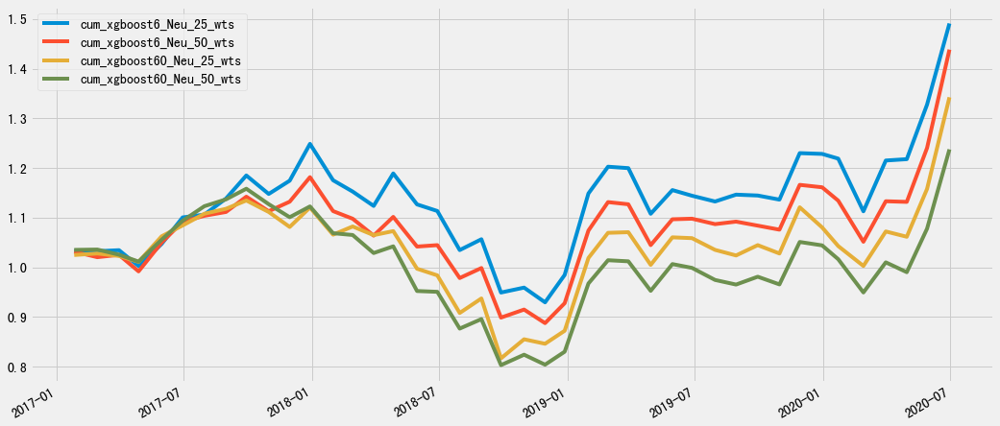

In [5]:
## simple backtest 
rtn_df = pd.DataFrame(index=weight_df['date'].unique())
for wts in choose_list:
    tmp_df = weight_df[['date', 'code', 'rtn', wts]].dropna(axis=0)
    rtn_ls = []
    for date in weight_df['date'].astype(str).unique().tolist():
        rtn_ls.append(np.dot((1+tmp_df.query("date == @date")['rtn']), tmp_df.query("date == @date")[wts]))
    
    rtn_df.insert(len(rtn_df.columns), 'rtn_'+wts, rtn_ls)
    rtn_df['cum_'+wts] = rtn_df['rtn_'+wts].cumprod()

tmp_df = rtn_df[[ item for item in rtn_df.columns if item.startswith('cum_')]]
ax = tmp_df.plot(figsize=(16, 8))
ax.legend()
plt.show()

## 5. backtest by Qlib

In [7]:
import qlib
from qlib.config import REG_CN
from qlib.contrib.evaluate import backtest
from qlib.workflow import R
from qlib.workflow.record_temp import *
from qlib.utils import *
from qlib.data import D
from qlib.contrib.report import analysis_model, analysis_position
from qlib.contrib.strategy import TopkDropoutStrategy
from qlib.tests.data import GetData
sys.path.append('/root/workspace/QUANTAXIS/src')
from strategy import WeightStrategy
print(qlib.__version__)

0.7.0


In [8]:
provider_uri = "/root/workspace/.qlib/qlib_data/cn_data" 
benchmark = "SH000300"  
recorder_name = datetime.datetime.now().strftime('%Y%m%d%H%M')##每次运行必须更改，否则覆盖
weight_col = 'xgboost6_Neu_wts' ## weight_df column name
model_col = 'xgboost6' ## model name

if not exists_qlib_data(provider_uri):
    print(f"Qlib data is not found in {provider_uri}")
    GetData().qlib_data(target_dir=provider_uri, region=REG_CN)
qlib.init(provider_uri=provider_uri, region=REG_CN, logging_level=logging.ERROR)

[2407:MainThread](2021-07-23 08:49:42,444) INFO - qlib.Initialization - [config.py:287] - default_conf: client.
[2407:MainThread](2021-07-23 08:49:42,447) WARNING - qlib.Initialization - [config.py:302] - redis connection failed(host=127.0.0.1 port=6379), cache will not be used!
QUANTAXIS>> redis connection failed(host=127.0.0.1 port=6379), cache will not be used!
[2407:MainThread](2021-07-23 08:49:42,452) INFO - qlib.Initialization - [__init__.py:54] - qlib successfully initialized based on client settings.
[2407:MainThread](2021-07-23 08:49:42,453) INFO - qlib.Initialization - [__init__.py:55] - data_path=/root/workspace/.qlib/qlib_data/cn_data


In [9]:
## backtest config
BACKTEST_CONFIG = {
    "verbose": False,
    "limit_threshold": 0.095,
    "account": 100000000,
    "benchmark": benchmark,
    "deal_price": "close",
    "open_cost": 0.0005,
    "close_cost": 0.0015,
    "min_cost": 5,
}

In [10]:
def parse_qlib_df(df: pd.DataFrame, weight_col: str):
    ## 处理为符合qlib backtest要求的dataframe
    tmp = df[['date', 'code', weight_col, 'rtn']]
    tmp.columns = ['datetime', 'instrument', 'weight', 'rtn']
# weight_df['score'] = weight_df['score'] /100

    tmp['instrument'] = tmp['instrument'].apply(lambda x: 'SH'+x if x.startswith('6') else 'SZ'+x)
    tmp['datetime'] = tmp['datetime'].apply(pd.to_datetime)
    tmp = tmp[~tmp['weight'].isna()].set_index(['datetime', 'instrument']).sort_values(by=['datetime', 'weight'], ascending=[True, False])
    tmp = tmp[tmp.index.get_level_values(0) <= D.calendar()[-1]]
    return tmp

In [11]:
### 读取股票权重文件weight_df
df = pd.read_csv(data_dir+'weight_df_xgb.csv', index_col=0, dtype={'code':str}, encoding='gbk')
wts_cols = [col for col in df.columns.tolist() if col.endswith('_wts')]
df = df[['date', 'code', 'rtn'] + wts_cols]
# df = df.iloc[:, 0:5]
res_df = pd.DataFrame()
report_dict = {}
positions_dict = {}
df.head()

,date,code,rtn,xgboost6_Neu_25_wts,xgboost6_Neu_50_wts,xgboost60_Neu_25_wts,xgboost60_Neu_50_wts
0,2017-01-26,002310,0.090247,NaN,NaN,NaN,NaN
1,2017-01-26,601088,-0.016260,0.04,0.02,0.04,0.02
2,2017-01-26,601958,0.058824,NaN,NaN,NaN,NaN
3,2017-01-26,000061,-0.004230,NaN,NaN,NaN,NaN
4,2017-01-26,000977,0.068618,NaN,NaN,NaN,0.02


In [12]:
for wts_col in wts_cols:
    wts_df = parse_qlib_df(df, wts_col)
    wts_name = wts_col.replace('_wts', '')
    print(f'---------------------backtesting {wts_name}---------------------')
    
    strategy = WeightStrategy()
    report_normal, positions_normal = backtest(wts_df['weight'], strategy=strategy, **BACKTEST_CONFIG)

    report_dict[wts_name] = report_normal
    positions_dict[wts_name] = positions_normal
    res = risk_analysis(report_normal["return"] - report_normal["bench"] - report_normal["cost"]).T
    res.index = [wts_name]
    res_df = pd.concat([res_df, res], axis=0)


[2407:MainThread](2021-07-23 08:49:53,625) INFO - qlib.backtest caller - [__init__.py:148] - Create new exchange


---------------------backtesting xgboost6_Neu_25---------------------


/opt/conda/lib/python3.8/site-packages/qlib/contrib/backtest/exchange.py:152: FutureWarning:

Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.

[2407:MainThread](2021-07-23 08:50:21,052) INFO - qlib.backtest caller - [__init__.py:202] - Create new executor 
[2407:MainThread](2021-07-23 08:50:21,199) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-06]
QUANTAXIS>> No score found on predict date[2017-02-06]
[2407:MainThread](2021-07-23 08:50:21,203) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-07]
QUANTAXIS>> No score found on predict date[2017-02-07]
[2407:MainThread](2021-07-23 08:50:21,206) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-08]
QUANTAXIS>> No score found on predict date[2017-02-08]
[2407:MainThread](2021-07-23 08:50:21,209) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-09]
QUANTAXIS>>

---------------------backtesting xgboost6_Neu_50---------------------


/opt/conda/lib/python3.8/site-packages/qlib/contrib/backtest/exchange.py:152: FutureWarning:

Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.

[2407:MainThread](2021-07-23 08:52:18,752) INFO - qlib.backtest caller - [__init__.py:202] - Create new executor 
[2407:MainThread](2021-07-23 08:52:18,906) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-06]
QUANTAXIS>> No score found on predict date[2017-02-06]
[2407:MainThread](2021-07-23 08:52:18,910) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-07]
QUANTAXIS>> No score found on predict date[2017-02-07]
[2407:MainThread](2021-07-23 08:52:18,914) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-08]
QUANTAXIS>> No score found on predict date[2017-02-08]
[2407:MainThread](2021-07-23 08:52:18,919) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-09]
QUANTAXIS>>

---------------------backtesting xgboost60_Neu_25---------------------


/opt/conda/lib/python3.8/site-packages/qlib/contrib/backtest/exchange.py:152: FutureWarning:

Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.

[2407:MainThread](2021-07-23 08:55:39,586) INFO - qlib.backtest caller - [__init__.py:202] - Create new executor 
[2407:MainThread](2021-07-23 08:55:39,725) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-06]
QUANTAXIS>> No score found on predict date[2017-02-06]
[2407:MainThread](2021-07-23 08:55:39,729) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-07]
QUANTAXIS>> No score found on predict date[2017-02-07]
[2407:MainThread](2021-07-23 08:55:39,732) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-08]
QUANTAXIS>> No score found on predict date[2017-02-08]
[2407:MainThread](2021-07-23 08:55:39,736) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-09]
QUANTAXIS>>

---------------------backtesting xgboost60_Neu_50---------------------


/opt/conda/lib/python3.8/site-packages/qlib/contrib/backtest/exchange.py:152: FutureWarning:

Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.

[2407:MainThread](2021-07-23 08:57:36,755) INFO - qlib.backtest caller - [__init__.py:202] - Create new executor 
[2407:MainThread](2021-07-23 08:57:36,901) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-06]
QUANTAXIS>> No score found on predict date[2017-02-06]
[2407:MainThread](2021-07-23 08:57:36,906) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-07]
QUANTAXIS>> No score found on predict date[2017-02-07]
[2407:MainThread](2021-07-23 08:57:36,910) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-08]
QUANTAXIS>> No score found on predict date[2017-02-08]
[2407:MainThread](2021-07-23 08:57:36,915) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-09]
QUANTAXIS>>

In [20]:
print(res_df)
best_model = res_df['information_ratio'].idxmax()
report_normal, positions_normal = report_dict[best_model], positions_dict[best_model]

                      mean       std  annualized_return  information_ratio  max_drawdown
xgboost6_Neu_25   0.000153  0.005190           0.038504           0.467353     -0.105408
xgboost6_Neu_50   0.000072  0.004062           0.018162           0.281674     -0.072290
xgboost60_Neu_25 -0.000001  0.004741          -0.000361          -0.004799     -0.148675
xgboost60_Neu_50 -0.000089  0.003999          -0.022542          -0.355117     -0.159973


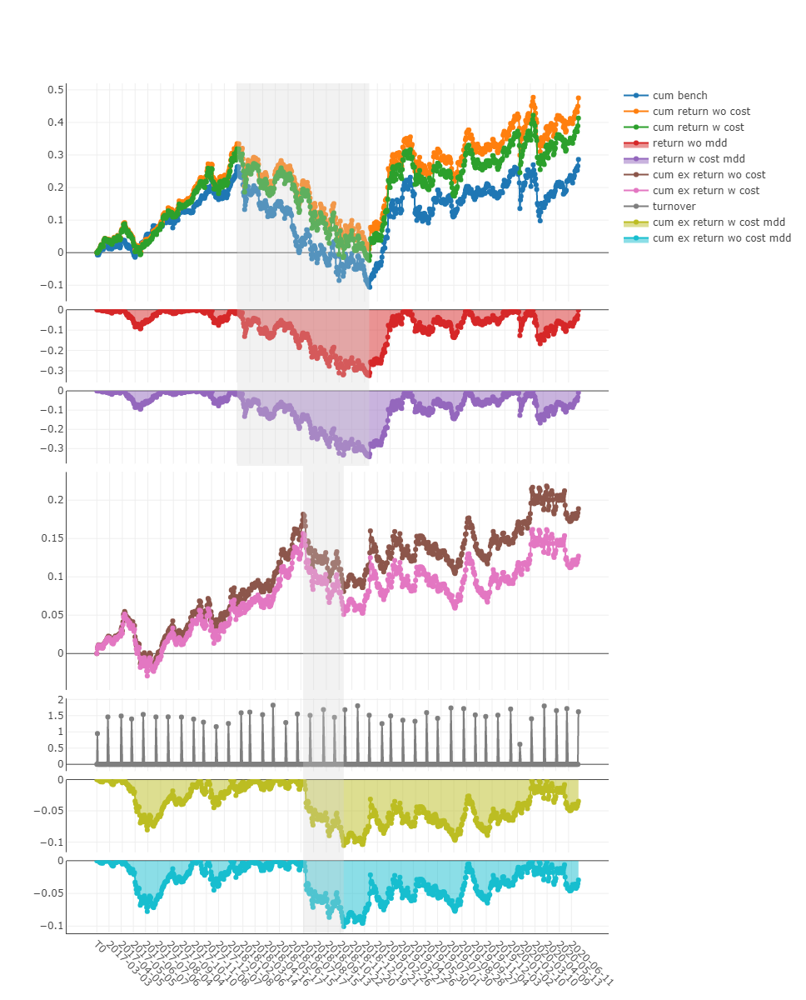

In [21]:
### return graph
analysis_position.report_graph(report_normal)

                                                  risk
excess_return_without_cost mean               0.000227
                           std                0.005186
                           annualized_return  0.057258
                           information_ratio  0.695578
                           max_drawdown      -0.100765
excess_return_with_cost    mean               0.000153
                           std                0.005190
                           annualized_return  0.038504
                           information_ratio  0.467353
                           max_drawdown      -0.105408


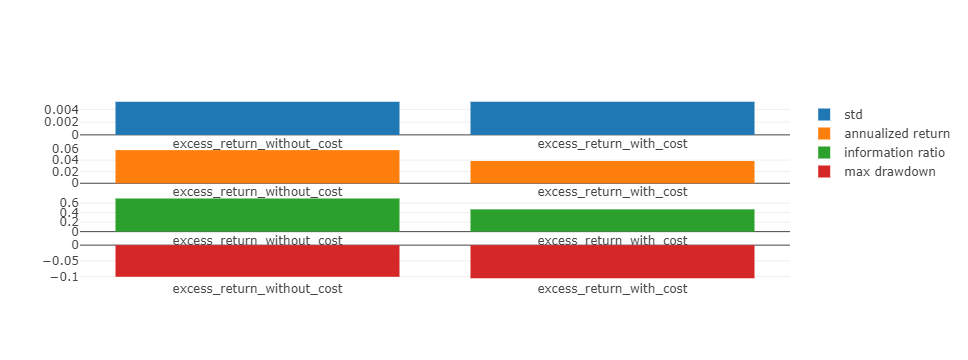

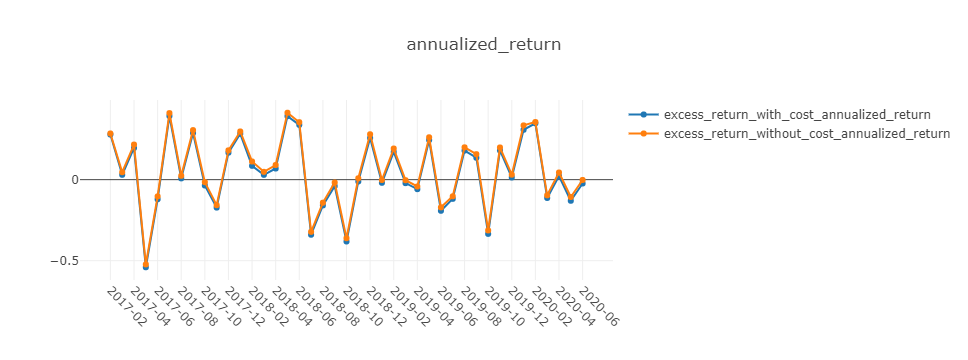

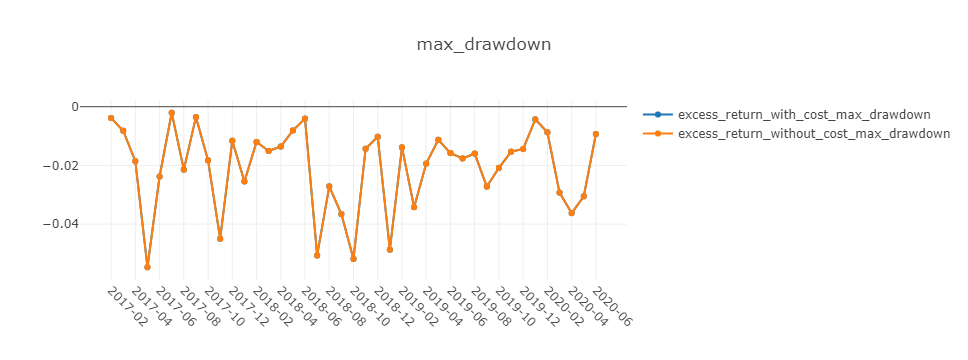

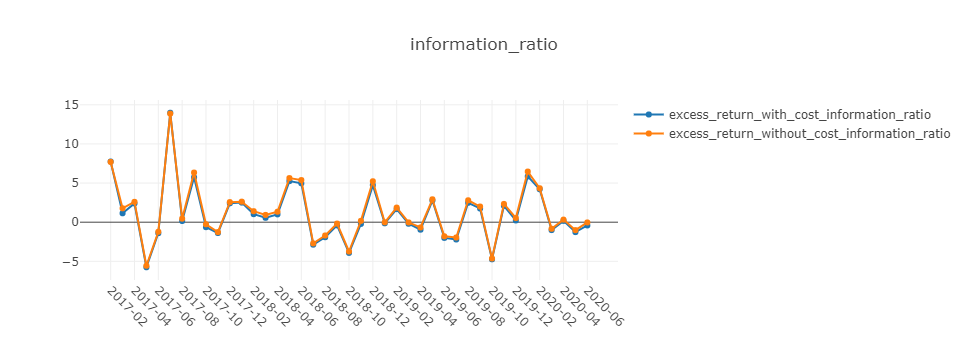

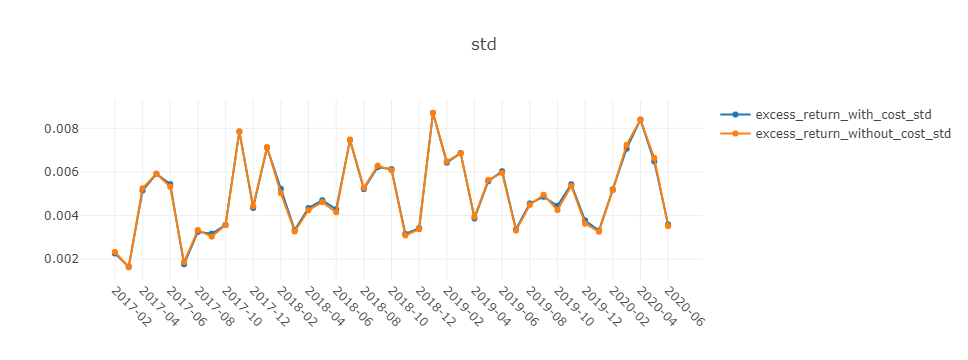

In [26]:
# analysis
analysis = dict()
analysis["excess_return_without_cost"] = risk_analysis(report_normal["return"] - report_normal["bench"])
analysis["excess_return_with_cost"] = risk_analysis(report_normal["return"] - report_normal["bench"] - report_normal["cost"])
analysis_df = pd.concat(analysis)  # type: pd.DataFrame
print(analysis_df)

analysis_position.risk_analysis_graph(analysis_df, report_normal)

In [23]:
## 读取model的predict文件，score为predict value， label为real return
model_df = pd.read_csv(data_dir+'model_df.csv', encoding='gbk', index_col=0, dtype={'code': str}, parse_dates=['date'])
model_df = model_df[model_df['dataset'] == 'test'][['date', 'code', model_col, 'rtn']]
model_df.columns = ['datetime', 'instrument', 'score', 'label'] ##col name must be score

model_df['instrument'] = model_df['instrument'].apply(lambda x: 'SH'+x if x.startswith('6') else 'SZ'+x)
model_df['datetime'] = model_df['datetime'].apply(pd.to_datetime)
model_df = model_df[~model_df['score'].isna()].set_index(['instrument', 'datetime']).sort_index()
model_df.head(5)

score     label
instrument datetime                    
SH600000   2017-01-26  0.1309 -0.008961
           2017-02-28 -0.1343 -0.034961
           2017-03-31  0.2474 -0.049969
           2017-04-28 -0.0374  0.111810
           2017-05-31 -0.0934 -0.014798

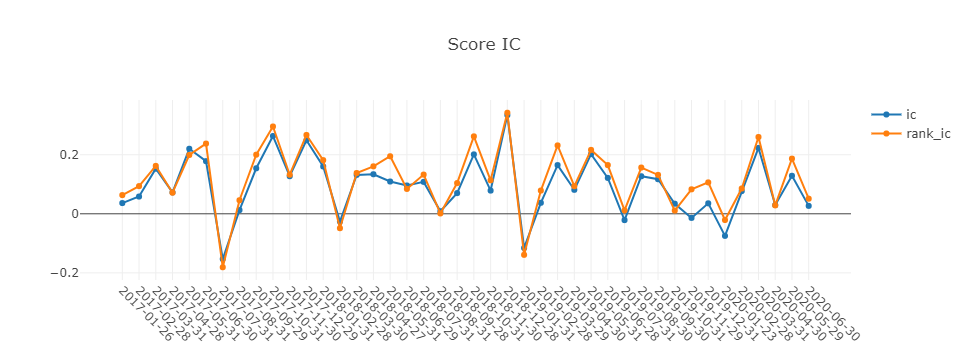

In [24]:
## ic graph
analysis_position.score_ic_graph(model_df)

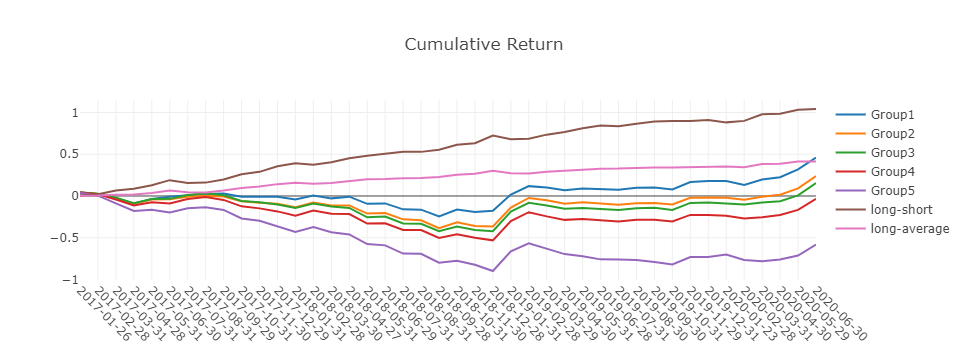

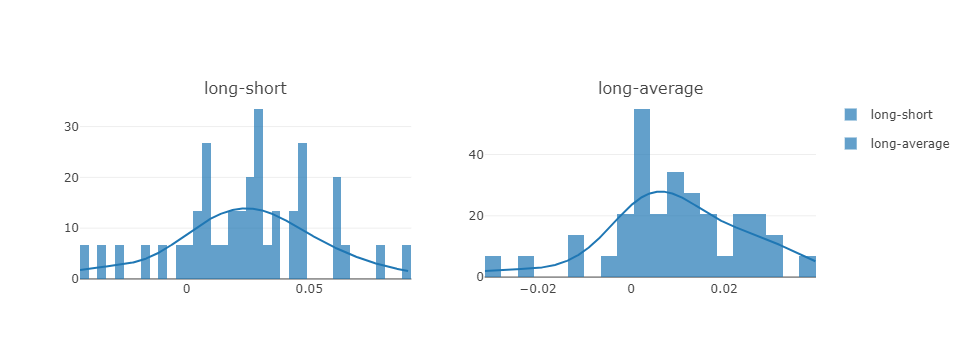

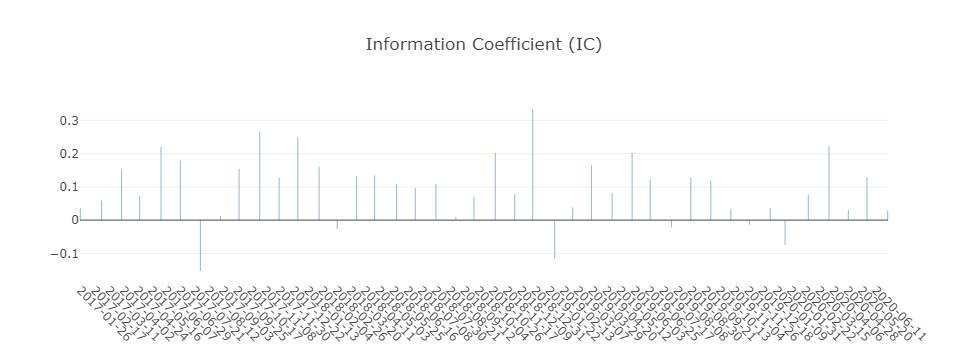

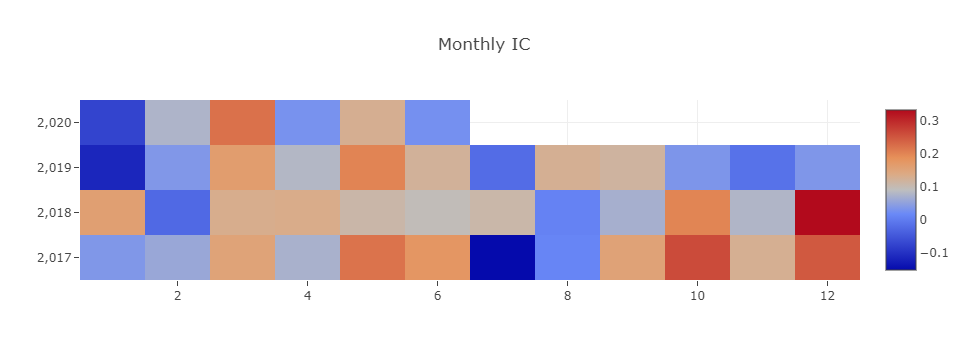

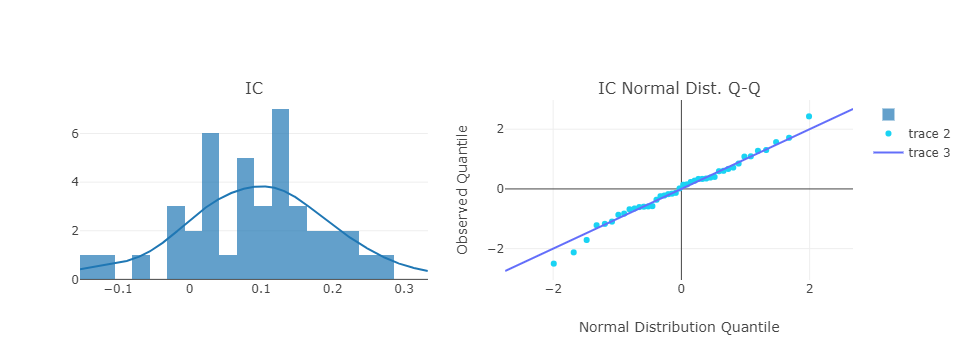

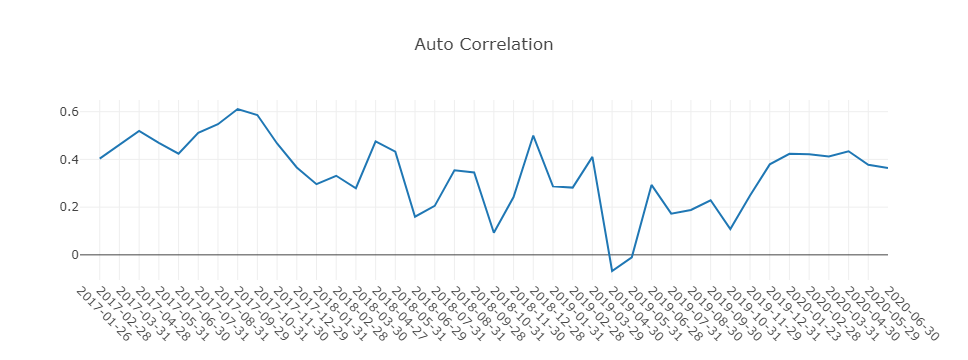

In [25]:
## group performance
analysis_model.model_performance_graph(model_df)

In [ ]:
### 处理持仓文件，增加buyDate和sellDate
def fetch_trade_info(df):    
    def _get_sell_date(date):
#         date = str(pd.to_datetime(date, format='%Y-%m-%d').date())
        if(QA.QA_util_if_trade(date)):
            return date.replace('-', '')
        else:
            return QA.QA_util_get_pre_trade_date(date).replace('-', '')
    
    df['date'] = df['date'].apply(lambda x: pd.to_datetime(x, format='%Y%m%d').date())
    sell_date_list = list(df['date'].unique().tolist())
    sell_date_list.append(QA.QA_util_get_next_trade_date(sell_date_list[-1], 20).replace('-', ''))
    
    df['sellDate'] = df['date'].apply(
        lambda x: _get_sell_date(sell_date_list[sell_date_list.index(x)+1]))
    df['buyDate'] = df['date'].apply(lambda x: QA.QA_util_get_next_trade_date(x).replace('-', ''))
    df = df[['buyDate', 'sellDate', 'code']].rename(columns={'code' : 'secID'})
    df = df[df['secID'].str.len() == 6] ## drop HONGKONG stock
    return df

trade_info = fetch_trade_info(weight_df[weight_df['xgboost6_Neu_wts'].notnull()][['date', 'code']])
trade_info.to_csv('xgboost6_Neu_wts_trade_info.csv', encoding='gbk')
trade_info.head()